In [164]:
#Import The Necessary Library 
import cv2 
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
print("Using OpenCV version", cv.__version__)

Using OpenCV version 4.1.2


**Task-1-Count the Numbers Of Rice For Both broken and unbroken**

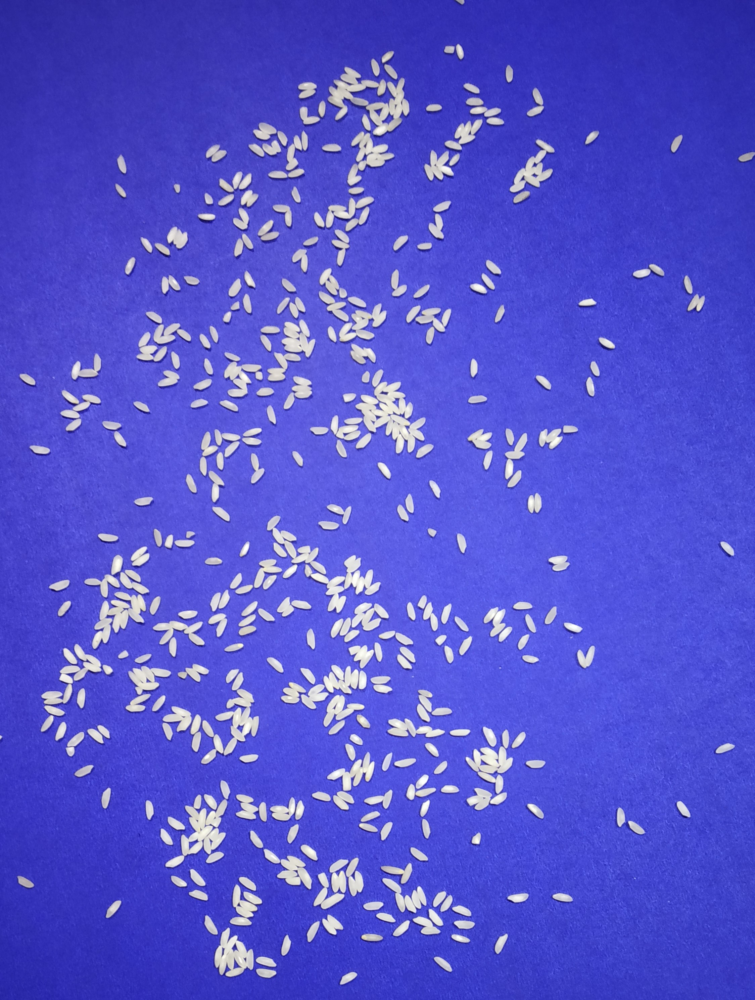

In [165]:
#Load Single image
input_rice = cv2.imread("/content/full)grain_2.jpg")
cv2_imshow(input_rice)

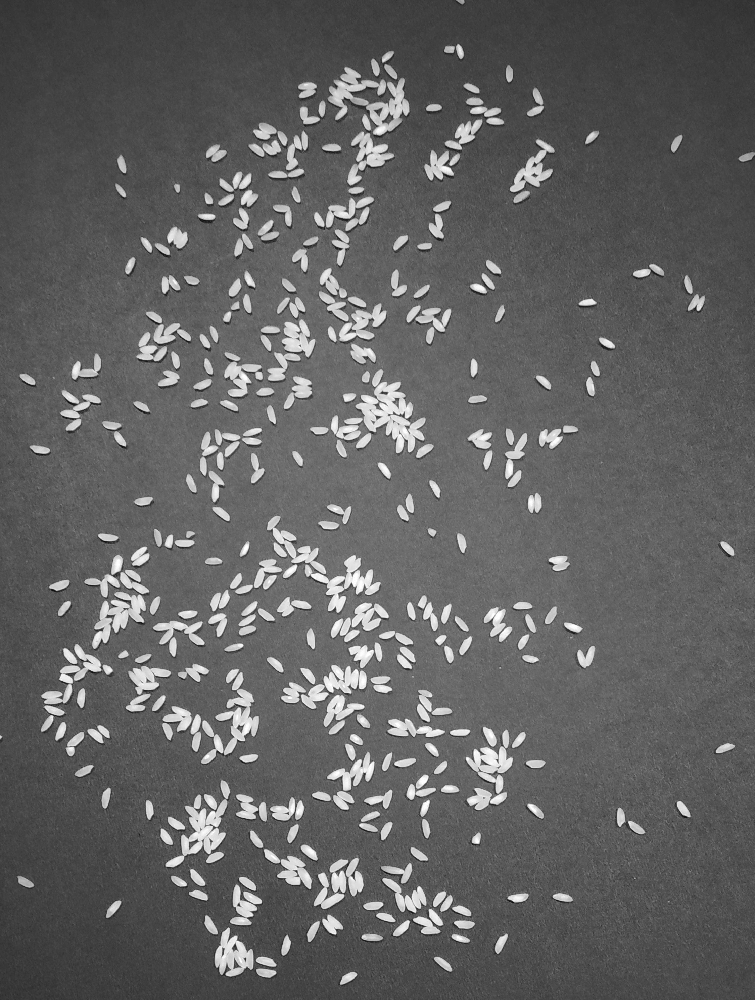

In [166]:
input_rice=cv2.cvtColor(input_rice,cv2.COLOR_BGR2GRAY) #Convert to grayscale
cv2_imshow(input_rice)

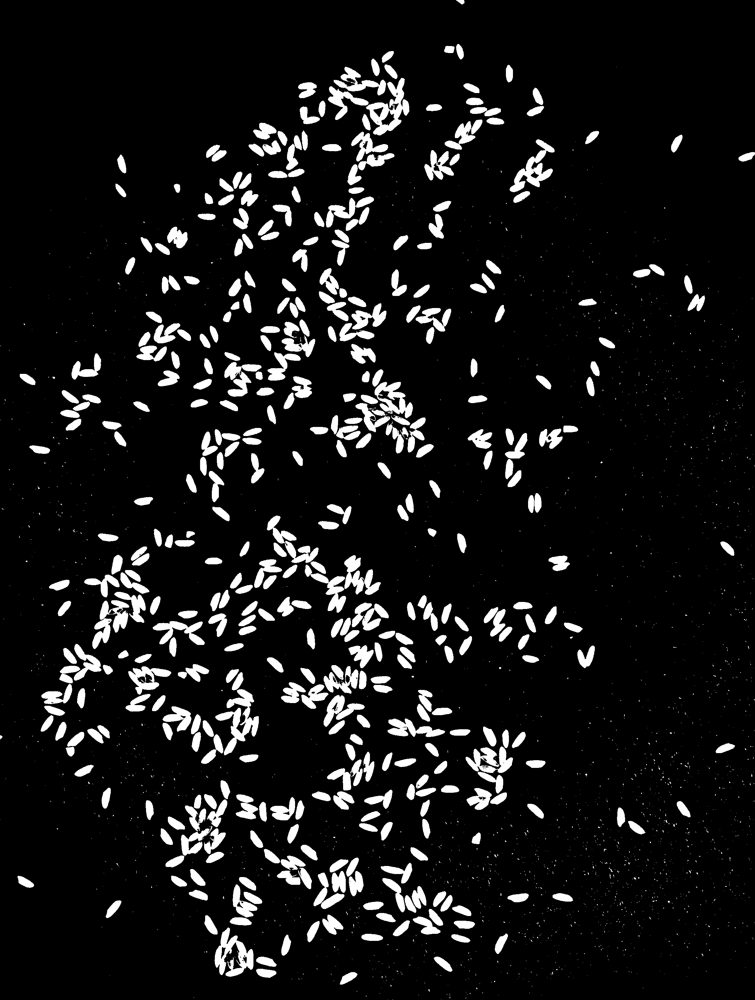

In [167]:
# local adaptive thresholding - computes local threshold based on given window size
output_adapthresh = cv2.adaptiveThreshold (input_rice, 255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 51, -20.0)
cv2_imshow(output_adapthresh)

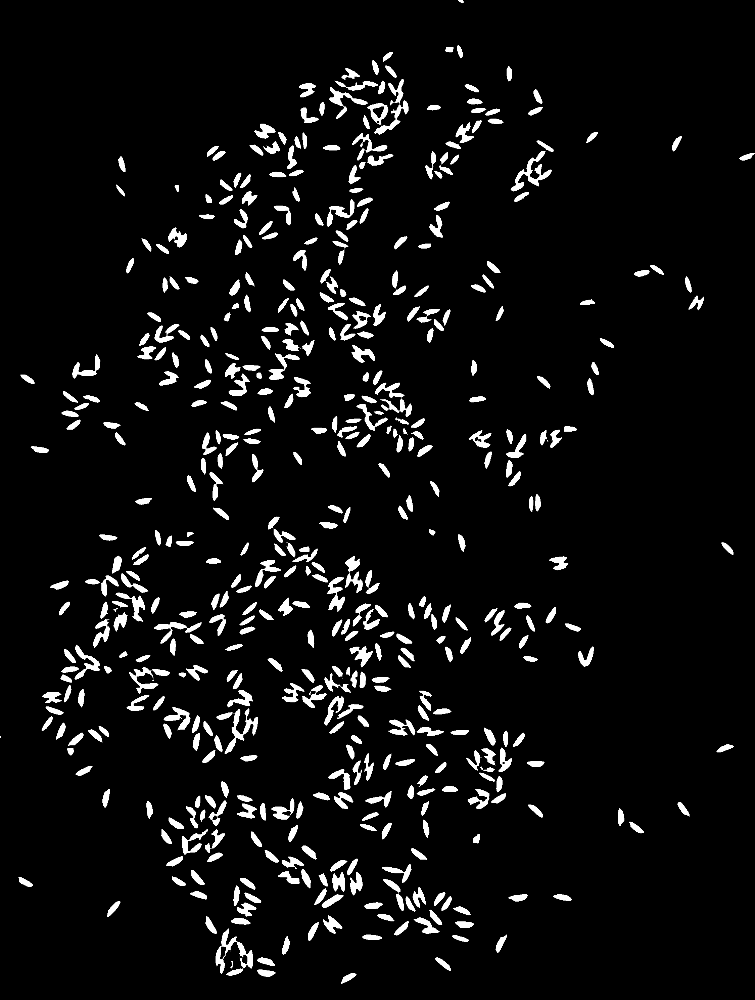

In [168]:
# morphologial erosion - cleaning up binary images
kernel = np.ones((5,5),np.uint8)
output_erosion = cv2.erode(output_adapthresh, kernel)
cv2_imshow(output_erosion)
#cv.imwrite('rice_erosion.png', output_erosion)

In [169]:
# connected components - counts and marks number of distinct foreground objects
# apply connected components on clean binary image
#label_image = output_erosion.copy()
#label_count = 0
#rows, cols = label_image.shape
#for j in range(rows):
    #for i in range(cols):
        #pixel = label_image[j, i]
        #if 255 == pixel:
            #label_count += 1
            #cv2.floodFill(label_image, None, (i, j), label_count)

#cv2_imshow(label_image)
#cv.imwrite('rice_components.png', label_image)

In [170]:
#print("Number of Rice", label_count)

In [171]:
# Contours - Computes polygonal contour boundary of foreground objects
# apply connected components on clean binary image
contours, hierarchy = cv2.findContours(output_erosion,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE) #Contour detection function
output_contour = cv2.cvtColor(input_rice, cv.COLOR_GRAY2BGR)

In [172]:
countAll=0 #Total number of rice grains
ares_avrg=0 #rice average
 #Traverse all the rice grains found
for cont in contours:
  ares = cv2.contourArea(cont)#Calculate the area of ​​surrounding traits
  if ares<50:
    continue
  countAll+=1 
  ares_avrg+=ares
  print("{}-blob:{}".format(countAll,ares),end=" ") #Print out the area of ​​each rice grain
  rect = cv2.boundingRect(cont) #Extract rectangle coordinates
  print("x:{} y:{}".format(rect[0],rect[1]))#Print coordinates
  cv2.rectangle(input_rice,rect,(0,0,0xff),1)#Draw a rectangle
  y=10 if rect[1]<10 else rect[1] #Prevent numbering outside the picture
  cv2.putText(input_rice,str(countAll), (rect[0], y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 255, 0), 1) #Write the number in the upper left corner of the rice grain
print("Average area of ​​rice grains:{}".format(round(ares_avrg/ares,2))) #Print out the area of ​​each grain

1-blob:660.0 x:1015 y:2896
2-blob:790.0 x:765 y:2886
3-blob:67.5 x:686 y:2860
4-blob:703.5 x:1295 y:2850
5-blob:769.5 x:765 y:2850
6-blob:734.0 x:840 y:2786
7-blob:514.0 x:1347 y:2783
8-blob:767.0 x:1476 y:2782
9-blob:705.5 x:1079 y:2782
10-blob:5380.5 x:642 y:2764
11-blob:797.5 x:917 y:2744
12-blob:796.0 x:1354 y:2743
13-blob:744.5 x:1173 y:2742
14-blob:804.0 x:688 y:2733
15-blob:1416.5 x:1232 y:2731
16-blob:819.5 x:611 y:2727
17-blob:1356.0 x:962 y:2725
18-blob:635.0 x:1123 y:2720
19-blob:701.5 x:1279 y:2708
20-blob:666.5 x:1349 y:2698
21-blob:768.0 x:1084 y:2686
22-blob:1197.0 x:705 y:2686
23-blob:729.5 x:318 y:2683
24-blob:583.0 x:1208 y:2668
25-blob:578.0 x:1314 y:2667
26-blob:807.0 x:1514 y:2662
27-blob:1088.0 x:958 y:2662
28-blob:703.5 x:1648 y:2661
29-blob:731.5 x:728 y:2657
30-blob:626.5 x:1292 y:2656
31-blob:701.0 x:565 y:2651
32-blob:699.0 x:936 y:2644
33-blob:1134.5 x:1229 y:2640
34-blob:755.5 x:695 y:2636
35-blob:1497.5 x:1141 y:2616
36-blob:724.0 x:714 y:2613
37-blob:638.

Number of detected contours 493


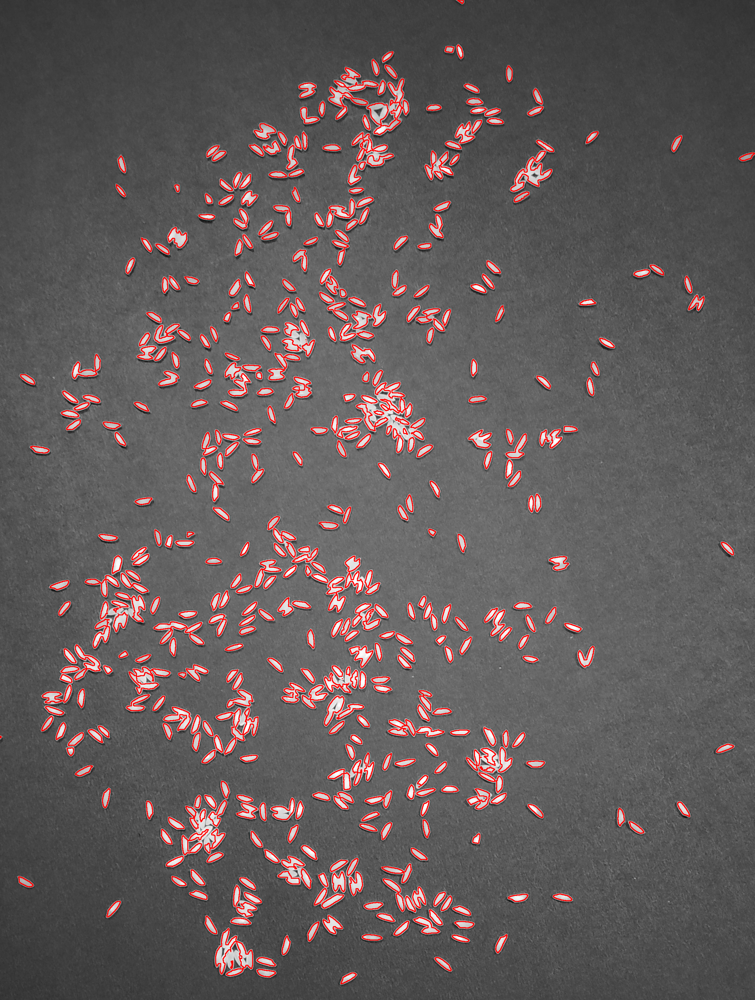

In [173]:
cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)
print("Number of detected contours", len(contours))
cv2_imshow(output_contour)
#cv.imwrite('rice_contours.png', output_contour)

In [174]:
# wait for key press
cv.waitKey(0)
cv.destroyAllWindows()

**Task-2-Average Percentage of Broken Rice**

**Step-1- Here Calculate the area that all the rice Both Broken And UnBroken**

In [175]:
countAll=0 #Total number of rice grains
ares_avrg=0 #rice average
 #Traverse all the rice grains found
for cont in contours:
  ares = cv2.contourArea(cont)#Calculate the area of ​​surrounding traits
  if ares<50:
    continue
  countAll+=1 
  ares_avrg+=ares
  print("{}-blob:{}".format(countAll,ares),end=" ") #Print out the area of ​​each rice grain
  rect = cv2.boundingRect(cont) #Extract rectangle coordinates
  print("x:{} y:{}".format(rect[0],rect[1]))#Print coordinates
  cv2.rectangle(input_rice,rect,(0,0,0xff),1)#Draw a rectangle
  y=10 if rect[1]<10 else rect[1] #Prevent numbering outside the picture
  cv2.putText(input_rice,str(countAll), (rect[0], y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 255, 0), 1) #Write the number in the upper left corner of the rice grain
print("Average area of ​​rice grains:{}".format(round(ares_avrg/ares,2))) #Print out the area of ​​each grain

1-blob:660.0 x:1015 y:2896
2-blob:790.0 x:765 y:2886
3-blob:67.5 x:686 y:2860
4-blob:703.5 x:1295 y:2850
5-blob:769.5 x:765 y:2850
6-blob:734.0 x:840 y:2786
7-blob:514.0 x:1347 y:2783
8-blob:767.0 x:1476 y:2782
9-blob:705.5 x:1079 y:2782
10-blob:5380.5 x:642 y:2764
11-blob:797.5 x:917 y:2744
12-blob:796.0 x:1354 y:2743
13-blob:744.5 x:1173 y:2742
14-blob:804.0 x:688 y:2733
15-blob:1416.5 x:1232 y:2731
16-blob:819.5 x:611 y:2727
17-blob:1356.0 x:962 y:2725
18-blob:635.0 x:1123 y:2720
19-blob:701.5 x:1279 y:2708
20-blob:666.5 x:1349 y:2698
21-blob:768.0 x:1084 y:2686
22-blob:1197.0 x:705 y:2686
23-blob:729.5 x:318 y:2683
24-blob:583.0 x:1208 y:2668
25-blob:578.0 x:1314 y:2667
26-blob:807.0 x:1514 y:2662
27-blob:1088.0 x:958 y:2662
28-blob:703.5 x:1648 y:2661
29-blob:731.5 x:728 y:2657
30-blob:626.5 x:1292 y:2656
31-blob:701.0 x:565 y:2651
32-blob:699.0 x:936 y:2644
33-blob:1134.5 x:1229 y:2640
34-blob:755.5 x:695 y:2636
35-blob:1497.5 x:1141 y:2616
36-blob:724.0 x:714 y:2613
37-blob:638.

In [176]:
print("Number of rice(Both Broken and Unbroken )",countAll)

Number of rice(Both Broken and Unbroken ) 484


**Step-2- Here The Area That Only Broken Rice Held**

In [177]:
count=0 #Total number of rice grains
ares_avrg=0 #rice average
 #Traverse all the rice grains found
for cont in contours:
  ares = cv2.contourArea(cont)#Calculate the area of ​​surrounding traits
  if ares<50:#Get area Less Then 50 Because Their is an assumption that broken rice is small
    
    count+=1 
    ares_avrg+=ares
    print("{}-blob:{}".format(count,ares),end=" ") #Print out the area of ​​each rice grain
    rect = cv2.boundingRect(cont) #Extract rectangle coordinates
    print("x:{} y:{}".format(rect[0],rect[1]))#Print coordinates
    cv2.rectangle(input_rice,rect,(0,0,0xff),1)#Draw a rectangle
    y=10 if rect[1]<10 else rect[1] #Prevent numbering outside the picture
    cv2.putText(input_rice,str(count), (rect[0], y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 255, 0), 1) #Write the number in the upper left corner of the rice grain
print("Average area of ​​rice grains:{}".format(round(ares_avrg/ares,2))) #Print out the area of ​​each grain
  

1-blob:0.0 x:712 y:2847
2-blob:3.0 x:1247 y:2341
3-blob:10.0 x:0 y:2191
4-blob:0.0 x:1039 y:2033
5-blob:0.0 x:1019 y:2020
6-blob:0.0 x:1107 y:1827
7-blob:0.0 x:351 y:1826
8-blob:0.0 x:912 y:1015
9-blob:0.0 x:911 y:1010
Average area of ​​rice grains:0.14


In [178]:
print("Number Of Broken Rice",count)

Number Of Broken Rice 9


In [179]:
#Calulcate the avergae 
average=(count/countAll)*100

In [180]:
print("Avergae Percentage Of Broken Rice",average)

Avergae Percentage Of Broken Rice 1.859504132231405
